## Ploty_Project

This is to be completed in Python. You are given a dataset that contains the geo-codes for where customers shop and where customers live. You need to create (as best as you can) an interactive map that accomplishes the following: when a user clicks a shop, the customers who shop there are highlighted, lines are drawn from all the customers to that shop, or some such visual that helps the user to visualize where a store’s customers come from.

Please feel free to use any tool that is available. You can turn in a notebook or a python file.

## Before Execute

* We also explored geopandas, folium, boken, networkx packages, all of which could make this happen.
* This is the plotly version, which used Plotly API and Mapbox API for better layout.
* Plotly's Python package is updated frequently. Run pip `install plotly --upgrade` to make sure you're using the latest version.
* In case you don't want to run all cells, screenshots of functional map are provided at the end of the notebook. 

## Read File and Clean Data
(!!! Be sure to change your path accordingly if data set is not in the same folder with the notebook.)

In [3]:
import pandas as pd
import numpy as np
# read file (!!! be sure to change your path accordingly)
df = pd.read_excel('LaptopSalesLL.xlsx')
df.head()

,Date,Configuration,Customer Postcode,Store Postcode,Retail Price,Screen Size (Inches),Battery Life (Hours),RAM (GB),Processor Speeds (GHz),Integrated Wireless?,HD Size (GB),Bundled Applications?,customer X,customer Y,store X,store Y,Customer Latitude,Customer Longitude,Store Latitude,Store Longitude
0,2008-01-01 00:01:19,163,EC4V 5BH,SE1 2BN,455.0,15,5,1,2.0,Yes,80,Yes,532041,180995,534057.0,179682.0,51.512579,-0.098731,51.500186,-0.070057
1,2008-01-01 00:02:52,320,SW4 0JL,SW12 9HD,545.0,15,6,1,2.0,No,300,No,529240,175537,528739.0,173080.0,51.464129,-0.140912,51.442082,-0.149046
2,2008-01-01 00:04:18,23,EC3V 1LR,E2 0RY,515.0,15,4,1,2.0,Yes,300,Yes,533095,181047,535652.0,182961.0,51.512699,-0.083435,51.529346,-0.045410
3,2008-01-01 00:04:40,169,SW1P 3AU,SE1 2BN,395.0,15,5,1,2.0,No,40,Yes,529902,179641,534057.0,179682.0,51.500787,-0.129897,51.500186,-0.070057
4,2008-01-01 00:06:04,365,EC4V 4EG,SW1V 4QQ,585.0,15,6,2,2.0,No,120,Yes,531684,180948,528924.0,178440.0,51.51212,-0.103737,51.490255,-0.144474


In [4]:
# found abnormal values after exploration
# normalize dataset, replace them with NaN
# change to numeric values
df['Customer Latitude'] = df['Customer Latitude'].replace('FAILED','')
df['Customer Longitude'] = df['Customer Longitude'].replace('FAILED','')
df['Customer Latitude'] = pd.to_numeric(df['Customer Latitude'])
df['Customer Longitude'] = pd.to_numeric(df['Customer Longitude'])

In [5]:
# check for nulls
df.isnull().sum()

Date                          0
Configuration                 0
Customer Postcode             0
Store Postcode                0
Retail Price              13435
Screen Size (Inches)          0
Battery Life (Hours)          0
RAM (GB)                      0
Processor Speeds (GHz)        0
Integrated Wireless?          0
HD Size (GB)                  0
Bundled Applications?         0
customer X                    0
customer Y                    0
store X                     148
store Y                     148
Customer Latitude           384
Customer Longitude          384
Store Latitude              148
Store Longitude             148
dtype: int64

In [6]:
# remove nulls
df = df[df["Customer Latitude"].notnull()]
df = df[df["Customer Longitude"].notnull()]
df = df[df["Store Latitude"].notnull()]
df = df[df["Store Longitude"].notnull()]
df.isnull().sum()

Date                          0
Configuration                 0
Customer Postcode             0
Store Postcode                0
Retail Price              13415
Screen Size (Inches)          0
Battery Life (Hours)          0
RAM (GB)                      0
Processor Speeds (GHz)        0
Integrated Wireless?          0
HD Size (GB)                  0
Bundled Applications?         0
customer X                    0
customer Y                    0
store X                       0
store Y                       0
Customer Latitude             0
Customer Longitude            0
Store Latitude                0
Store Longitude               0
dtype: int64

In [7]:
# make new data frame
new_df = df
# reset index
new_df = new_df.reset_index(drop=True)

## Prepare Useful Data for Graph Object

In [8]:
# separate useful data from dataframe
Customer_Latitude = new_df['Customer Latitude']
Customer_Longitude = new_df['Customer Longitude']
Store_Latitude = new_df['Store Latitude']
Store_Longitude = new_df['Store Longitude']

In [9]:
# make customer and store coordinate pairs for finding unique points
new_df['C_Coord'] = list(zip(new_df['Customer Longitude'], new_df['Customer Latitude']))
new_df['S_Coord'] = list(zip(new_df['Store Longitude'], new_df['Store Latitude']))

In [10]:
# number of customers
customers = new_df['C_Coord'].unique()
len(customers)

833

In [11]:
# number of stores
stores = new_df['S_Coord'].unique()
len(stores)

15

In [12]:
len(df)

296833

In [13]:
# prepare data for making graph objects
stores_lon = [i[0] for i in stores]
stores_lat = [i[1] for i in stores]
customers_lon = [i[0] for i in customers]
customers_lat = [i[1] for i in customers]

## Make Object

### * stores object

In [14]:
import plotly
import plotly.plotly as py
import plotly.graph_objs as go
plotly.offline.init_notebook_mode()

# make store object points
cases_s = []
cases_s.append(go.Scattermapbox(
        lon = stores_lon,
        lat = stores_lat,
        marker = {'color': 'rgb(51,204,153)', 'size': 15}, # 'symbol': 'star', if you don't need marker.color function.
        ### Note that the array `marker.color` and `marker.size` are only available for "circle" symbols.
        name = 'stores',
        mode = 'markers',
        text = []
    ))

In [15]:
# check if object is successfully built
cases_s[0]

Scattermapbox({
    'lat': [51.500186, 51.442082, 51.529346000000004, 51.490255, 51.483307,
            51.461802, 51.398191, 51.551091, 51.485033, 51.500787, 51.541776,
            51.600827, 51.51937, 51.418946999999996, 51.593016],
    'lon': [-0.07005700000000001, -0.149046, -0.04541, -0.144474, -0.025775,
            -0.199785, -0.09363099999999999, -0.137239, -0.279066, -0.129897,
            0.037959, -0.194725, -0.211483, -0.305625, -0.070008],
    'marker': {'color': 'rgb(51,204,153)', 'size': 15},
    'mode': 'markers',
    'name': 'stores',
    'text': []
})

### * customers object

In [16]:
# make customer object points
cases_c = []
cases_c.append(go.Scattermapbox(
        lon = customers_lon,
        lat = customers_lat,
        marker = {'color': 'rgb(255,153,0)', 'size': 8},
        name = 'customers',
        mode = 'markers',
        opacity = .5,
        text = []
    ))

In [17]:
# check if object is successfully built
cases_c[0]

Scattermapbox({
    'lat': [51.512578999999995, 51.464129, 51.512699, ..., 51.454166, 51.506137,
            51.53028],
    'lon': [-0.098731, -0.14091199999999998, -0.08343500000000001, ..., -0.317807,
            -0.14685499999999999, -0.11738599999999999],
    'marker': {'color': 'rgb(255,153,0)', 'size': 8},
    'mode': 'markers',
    'name': 'customers',
    'opacity': 0.5,
    'text': []
})

### * links object for each store

In [18]:
# find unique links between all stores and customers
new_df['relations'] = list(zip(new_df['C_Coord'], new_df['S_Coord']))
relations = new_df['relations'].unique()
len(relations)

2499

In [19]:
# check relations structure
relations[:][0]
# (c_lon,c_lat),(s_lon,s_lat)

((-0.098731, 51.512578999999995), (-0.07005700000000001, 51.500186))

In [20]:
# build links for each store and store them in a list
all_links = []
number_of_links = []

for store in range(len(stores)):
    select = [i for i in relations if i[1] == stores[store]] # find each store
    
    select_lon_left = [i[0][0] for i in select] # prepare longitude of each point for links
    select_lon_right = [i[1][0] for i in select]
    select_lon = []
    for i in range(len(select)): 
        select_lon.append(select_lon_left[i])
        select_lon.append(select_lon_right[i])
        
    select_lat_left = [i[0][1] for i in select] # prepare latitude of each point for links
    select_lat_right = [i[1][1] for i in select]
    select_lat = []
    for i in range(len(select)):
        select_lat.append(select_lat_left[i])
        select_lat.append(select_lat_right[i])
        
    number_of_links.append(len(select_lon_left))
    links = [] # build links for each store
    links.append(go.Scattermapbox(
                lon = select_lon, 
                lat = select_lat, 
                mode = 'lines',
                line = {'width': 2, 'color': 'rgb(51,204,153)'},
                name = 'links_to_store_' + str(store + 1),
                text = 'There are ' + str(len(select_lon)//2) + ' links to store_' + str(store + 1) ## pop-up for links
            ))
    
    all_links.append(links) # combine all link sets

In [21]:
# check if link object is successfully built
all_links[0]

[Scattermapbox({
     'lat': [51.512578999999995, 51.500186, 51.500787, ..., 51.500186,
             51.517047999999996, 51.500186],
     'line': {'color': 'rgb(51,204,153)', 'width': 2},
     'lon': [-0.098731, -0.07005700000000001, -0.129897, ..., -0.07005700000000001,
             -0.11880999999999999, -0.07005700000000001],
     'mode': 'lines',
     'name': 'links_to_store_1',
     'text': 'There are 375 links to store_1'
 })]

### * links object for each customer

In [22]:
# build links for each customer and store them in a list
all_links_cust = []
number_of_links_cust = []

for customer in range(len(customers)):
    select = [i for i in relations if i[0] == customers[customer]] # find each store
    
    select_lon_left = [i[0][0] for i in select] # prepare longitude of each point for links
    select_lon_right = [i[1][0] for i in select]
    select_lon = []
    for i in range(len(select)): 
        select_lon.append(select_lon_left[i])
        select_lon.append(select_lon_right[i])
        
    select_lat_left = [i[0][1] for i in select] # prepare latitude of each point for links
    select_lat_right = [i[1][1] for i in select]
    select_lat = []
    for i in range(len(select)):
        select_lat.append(select_lat_left[i])
        select_lat.append(select_lat_right[i])
        
    number_of_links_cust.append(len(select_lon_left))
    links = [] # build links for each customer
    links.append(go.Scattermapbox(
                lon = select_lon, 
                lat = select_lat, 
                mode = 'lines',
                line = {'width': 2, 'color': 'rgb(255,51,102)'},
                name = 'links_to_customer_' + str(customer + 1),
                text = 'There are ' + str(len(select_lon)//2) + ' links to customer_' + str(customer + 1) ## pop-up for links
            ))
    
    all_links_cust.append(links) # combine all link sets

In [23]:
all_links_cust[0]

[Scattermapbox({
     'lat': [51.512578999999995, 51.500186, 51.512578999999995, 51.490255,
             51.512578999999995, 51.500787],
     'line': {'color': 'rgb(255,51,102)', 'width': 2},
     'lon': [-0.098731, -0.07005700000000001, -0.098731, -0.144474, -0.098731,
             -0.129897],
     'mode': 'lines',
     'name': 'links_to_customer_1',
     'text': 'There are 3 links to customer_1'
 })]

### * !! add pop_up window for each store

In [24]:
# add text to the popup
text = []
for i in number_of_links:
    text.append(str(i) + ' customers visited here!!!')

cases_s[0].text = text
cases_s[0]

Scattermapbox({
    'lat': [51.500186, 51.442082, 51.529346000000004, 51.490255, 51.483307,
            51.461802, 51.398191, 51.551091, 51.485033, 51.500787, 51.541776,
            51.600827, 51.51937, 51.418946999999996, 51.593016],
    'lon': [-0.07005700000000001, -0.149046, -0.04541, -0.144474, -0.025775,
            -0.199785, -0.09363099999999999, -0.137239, -0.279066, -0.129897,
            0.037959, -0.194725, -0.211483, -0.305625, -0.070008],
    'marker': {'color': 'rgb(51,204,153)', 'size': 15},
    'mode': 'markers',
    'name': 'stores',
    'text': [375 customers visited here!!!, 106 customers visited here!!!, 258
             customers visited here!!!, 366 customers visited here!!!, 140
             customers visited here!!!, 117 customers visited here!!!, 66 customers
             visited here!!!, 264 customers visited here!!!, 56 customers visited
             here!!!, 520 customers visited here!!!, 32 customers visited here!!!,
             25 customers visited here!

### * !! add pop_up window for each customer

In [25]:
# add text to the popup
text_cust = []
for i in number_of_links_cust:
    text_cust.append('This customer visited ' + str(i) + ' store(s)!!!')

cases_c[0].text = text_cust
cases_c[0]

Scattermapbox({
    'lat': [51.512578999999995, 51.464129, 51.512699, ..., 51.454166, 51.506137,
            51.53028],
    'lon': [-0.098731, -0.14091199999999998, -0.08343500000000001, ..., -0.317807,
            -0.14685499999999999, -0.11738599999999999],
    'marker': {'color': 'rgb(255,153,0)', 'size': 8},
    'mode': 'markers',
    'name': 'customers',
    'opacity': 0.5,
    'text': [This customer visited 3 store(s)!!!, This customer visited 3
             store(s)!!!, This customer visited 3 store(s)!!!, ..., This customer
             visited 3 store(s)!!!, This customer visited 3 store(s)!!!, This
             customer visited 3 store(s)!!!]
})

## Set Map Layout

These are projections of map you can choose from if using scattergeo instead of scattermapbox:

`'equirectangular', 'mercator', 'orthographic', 'natural earth', 'kavrayskiy7', 'miller', 'robinson', 'eckert4', 'azimuthal equal area', 'azimuthal equidistant', 'conic equal area', 'conic conformal',  'conic equidistant', 'gnomonic', 'stereographic', 'mollweide', 'hammer', 'transverse mercator', 'albers usa', 'winkel tripel', 'aitoff', 'sinusoidal'`

In [26]:
mapbox_access_token = 'pk.eyJ1IjoiYWRhbGl4IiwiYSI6ImNqcGRjbDJqMDBmbDUzcG8yank1cjY1dmcifQ.RfN9GixVVUltAg3z4ezmKw'

!!! This the mapbox API access token. You can also create your own at https://www.mapbox.com/studio/

In [27]:
# prepare layout for mapping
layout = go.Layout(
    autosize = True,
    hovermode = 'closest',
    title = 'Map: Customer & Store Relationship',
    mapbox = dict(
        accesstoken = mapbox_access_token,
        bearing = 0,
        center = dict(
            lat = 51,
            lon = 0
        ),
        pitch = 0,
        zoom = 5
    ),
)
#########      This is the version without Scattermapbox           #####################
#### Change all Scattermapbox object to Scattergeo if you want to use this version #####
# layout = go.Layout(
#     title = 'Map: Customer & Store Relationship',
#     geo = dict(
#         resolution = 110,
#         scope = 'world',
#         showframe = False,
#         showcoastlines = False,
#         showland = True,
#         landcolor = "rgb(229, 229, 229)" ,
#         countrycolor = "rgb(255, 255, 255)",
#         coastlinecolor = "rgb(255, 255, 255)",
#         projection = dict( type = 'equirectangular' ), # choose as your preference from above
#         lonaxis = dict( range = [ -1.0, 1.0 ] ),
#         lataxis = dict( range = [ 51.0, 52.0 ] ),    
#     ),
# #     legend = dict(traceorder = 'reversed'), # choose as your preference
# )

## Set Interactive Function

This is the part I need to use array like `marker.color`. 

For this part to work properly, the only option for marker shape is circle.

[Documentation](https://plot.ly/python/reference/#scattermapbox) : "Sets the marker symbol. Full list: https://www.mapbox.com/maki-icons/ Note that the array `marker.color` and `marker.size` are only available for "circle" symbols.". 

In [28]:
# prepare link object structure to pass in the figure
temp = [go.Scattermapbox({
     'line': {'color': 'rgb(51,204,153)', 'width': 2},
     'mode': 'lines',
})]

temp_cust = [go.Scattermapbox({
     'line': {'color': 'rgb(255,51,102)', 'width': 2},
     'mode': 'lines',
 })]

# make map figure
f = go.FigureWidget(layout = layout, data = temp + cases_c + temp_cust + cases_s)

# prepare stores object for interactive actions
scatter_cust = f.data[1]
scatter_cust.marker.color = ['rgb(255,153,0)'] * len(customers)
scatter = f.data[3]
scatter.marker.color = ['rgb(51,204,153)'] * 15
scatter.marker.size = [15] * 15
f.layout.hovermode = 'closest'

# prepare links object for interactive actions
lines = f.data[0]
lines_cust = f.data[2]

# callback function for click_on interaction
# you can see the color and size of the store updated on the map!!
def update_point(trace, points, selector):
    c = list(scatter.marker.color)
    s = list(scatter.marker.size)
    for i in points.point_inds:
        # update clicked store and links
        c[i] = 'rgb(255,51,102)'
        s[i] = 25
        scatter.marker.color = c
        scatter.marker.size = s
        # get index of clicked store and pass it to links for update
        lines.lat = all_links[i][0].lat
        lines.lon = all_links[i][0].lon
        lines.name = all_links[i][0].name
        lines.text = all_links[i][0].text
    
def update_point_cust(trace, points, selector):
    c = list(scatter_cust.marker.color)
    for i in points.point_inds:
        # update clicked customer and links
        c[i] = 'blue'
        scatter_cust.marker.color = c
        # get index of clicked customer and pass it to links for update
        lines_cust.lat = all_links_cust[i][0].lat
        lines_cust.lon = all_links_cust[i][0].lon
        lines_cust.name = all_links_cust[i][0].name
        lines_cust.text = all_links_cust[i][0].text

# click interactive function
scatter.on_click(update_point)
scatter_cust.on_click(update_point_cust)

## Show Map with Click_on Interaction

#### Read Before Checking the Map:

* `Green Circle` : unclicked stores
* `Red Circle` : clicked stores
* `Yellow Dot` : unclicked custmers
* `Blue Dot` : clicked customers
* `Green Lines` : store -----> customers
* `Red Lines` : customer -----> stores
* `Pop-up Window` contains: 
    1. how many `customers` came to a certain `store`; 
    2. how many `stores` a certain `customer` visited; 
    3. how many `lines` draw from which `store`; 
    4. how many `lines` draw from which `customer`;


* Single click circle to see show lines.
* Single click legend to show or hide objects.
* Double click legend to see only the selected object.
* Slide to zoom in for details or zoom out for whole world map.
* Ckeck from `Pop-up Window` if it's the object you want to select before clicking. Hide other objects if you wish to click more accurately.


* Once a `store` is clicked, it will change from `Green Circle` to bigger `Red Circle`. `Green Lines` will draw from `store`.
* Once a `custmer` is clicked, it will change from `Yellow Circle` to `Blue Circle`. `Red Lines` will draw from `custmer`.
* Legend's color and name will be updated on the right side of the map.

In [29]:
plotly.tools.set_credentials_file(username = 'adalix', api_key = 'Xy22gptCqzr6eQYewPDD')

!!!! This is my Plotly API access, please don't share this publicly.
You can also create your own at https://plot.ly/feed/#/

In [30]:
# show figure 
## make sure you run all the aboves for widgets to show.
f

FigureWidget({
    'data': [{'line': {'color': 'rgb(51,204,153)', 'width': 2},
              'mode': 'lines',
…

## Alternative Method: multiple stores at the same time, interact with legend

* Single click legend on the right side of the map to show or hide multiple store links at the same time.
* Double click legend to see only the selected object.

In [31]:
# show figure 
## make sure you run all the aboves for widgets to show.
f_alt = go.FigureWidget(layout = layout, data = \
                      all_links[0] + all_links[1] + all_links[2] + all_links[3] + \
                      all_links[4] + all_links[5] + all_links[6] + all_links[7] + \
                      all_links[8] + all_links[9] + all_links[10] + all_links[11] + \
                      all_links[12] + all_links[13] + all_links[14] + cases_c + cases_s)

f_alt

FigureWidget({
    'data': [{'lat': [51.512578999999995, 51.500186, 51.500787, ..., 51.500186,
               …

## Pictures of Working Map

* Screenshots of the functional map.
* We also provid an HTML version of the notebook for viewing convenience.
* Notice the difference of pop up windows and the legend's name and color.
* Details of interpreting the map: see from `Show Map with Click_on Interaction` part.

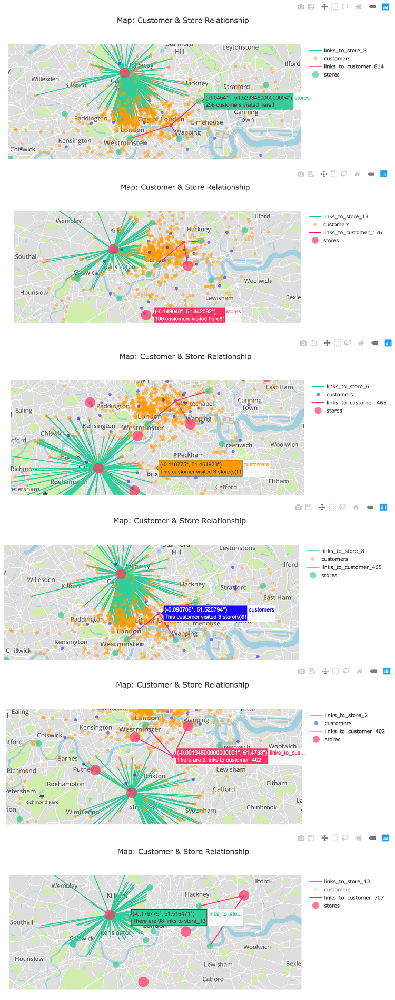

In [32]:
from PIL import Image
Image.open("click_on.jpeg")

#### This is an alternative mapping version, which you could choose to show multiple store links.

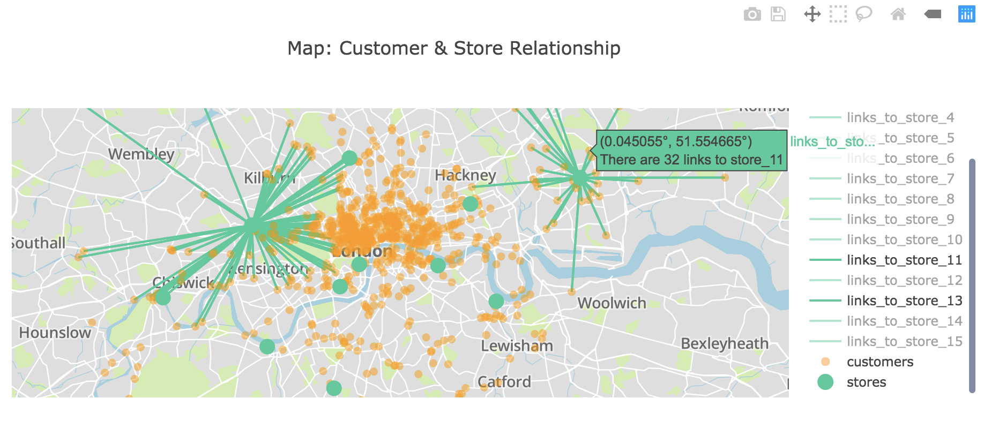

In [33]:
Image.open("legend_1.png")

#### Exploration of other packages. Below is a prototype of folium version.

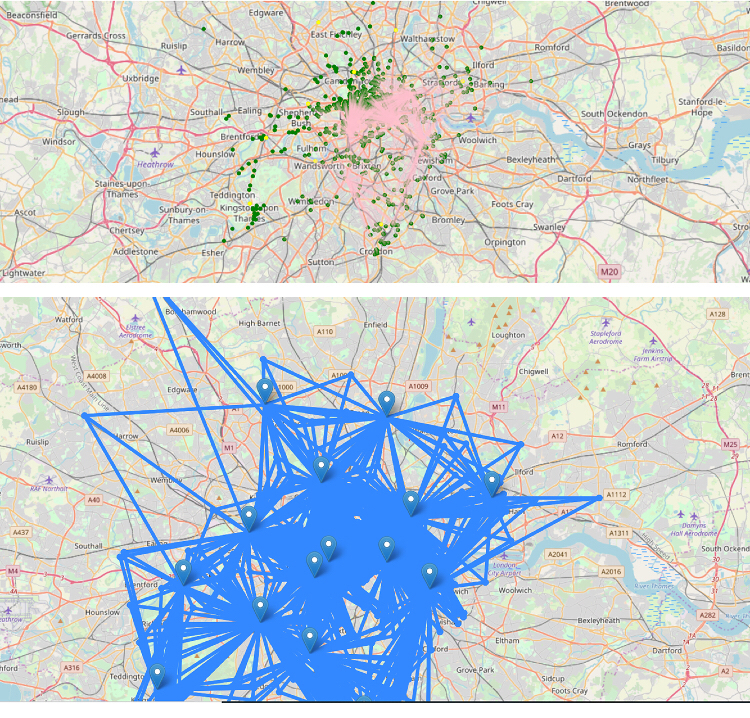

In [34]:
Image.open("folium.jpeg")

## Documentation for Functions Used in This Project
* https://plot.ly/python/click-events/
* https://plot.ly/python/reference/
* https://plot.ly/python/reference/#scattermapbox
* https://plot.ly/python/user-guide/#layout
* https://plot.ly/python/scattermapbox/
* https://www.mapbox.com/maki-icons/